In [1]:
from sqlite3 import SQLITE_CREATE_VIEW
import anndata
import scanpy as sc
import os
#from bbknn import bbknn
import matplotlib.pyplot as plt
import omicverse as ov
#import scib
from scvi.model.utils import mde
#from scib_metrics.benchmark import Benchmarker
import scvi
#import scanorama
import numpy as np
#import pyliger
#from harmony import harmonize
from rich import print
import seaborn as sns
#import bbknn
#import doubletdetection
%matplotlib inline
import pandas as pd
plt.rcParams.update({'font.size': 12})


   ____            _     _    __                  
  / __ \____ ___  (_)___| |  / /__  _____________ 
 / / / / __ `__ \/ / ___/ | / / _ \/ ___/ ___/ _ \ 
/ /_/ / / / / / / / /__ | |/ /  __/ /  (__  )  __/ 
\____/_/ /_/ /_/_/\___/ |___/\___/_/  /____/\___/                                              

Version: 1.5.3, Tutorials: https://omicverse.readthedocs.io/


[rank: 0] Global seed set to 0


In [2]:
plt.rcParams['pdf.fonttype'] = 42  # Ensures that fonts are saved as text, not outlines
plt.rcParams['font.sans-serif'] = ['Arial']  # Use Arial or another common font
# Change the font to 'DejaVu Sans' or another available font
plt.rcParams['font.sans-serif'] = ['DejaVu Sans']
plt.rcParams['font.family'] = 'sans-serif'

In [3]:
#####Change path and Load data
os.chdir("/storage/liuxiaodongLab/fanxueying/mayanalysis/2024Aug")
adata = anndata.read_h5ad("monkey_reanno_clean.h5ad")

In [4]:
adata

AnnData object with n_obs × n_vars = 141868 × 44223
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'sample', 'stage', 'percent.mt', 'species', 'embryo', 'platform', 'ann_level_2', 'ann_level_3', 'ann_level_1', 'doublet', 'doublet_score', 'Unintegrated_res_0.5', 'Scanorama_res_0.5', 'LIGER_res_0.5', 'Harmony_res_0.5', 'scVI_res_0.5', 'scANVI_res_0.5', 'CCA_res_0.5', 'FastMNN_res_0.5', 'leiden_1', 'leiden_2', 'leiden_3', 'leiden_4', 'reanno', 'lineage', 'unicorns', 'combined_annotation'
    var: 'features', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'CCA_res_0.5_colors', 'FastMNN_res_0.5_colors', 'Harmony_res_0.5_colors', 'LIGER_res_0.5_colors', 'Scanorama_res_0.5_colors', 'Unintegrated_res_0.5_colors', 'anno_colors', 'harmo.anno_colors', 'hvg', 'leiden', 'leiden_3_colors', 'lineage_colors', 'log1p', 'neighbors', 'orig.ident_colors', 'pca', 'reanno_colors', 'scANVI_res_0.5_colors', 's

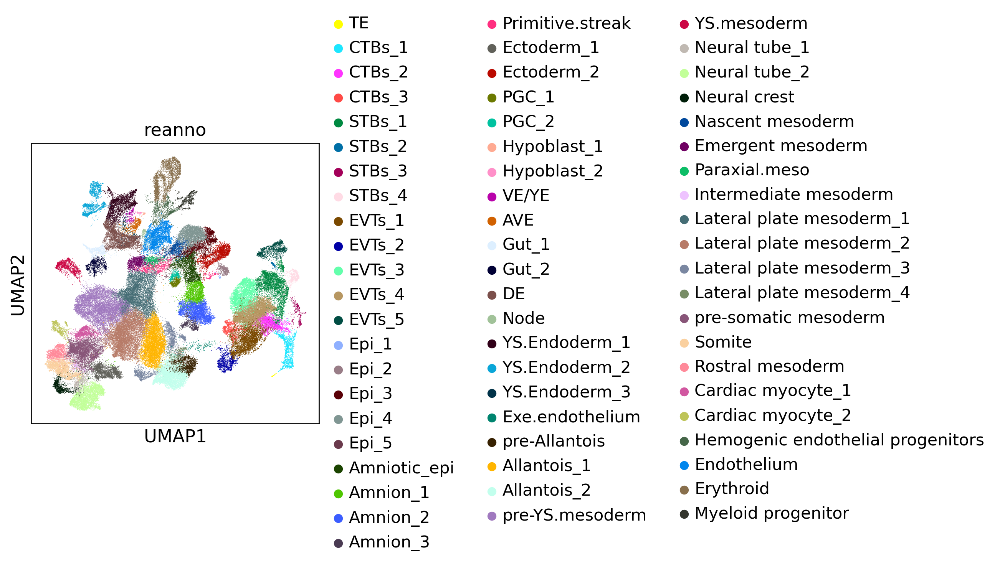

In [5]:
sc.pl.umap(adata, color=['reanno'])

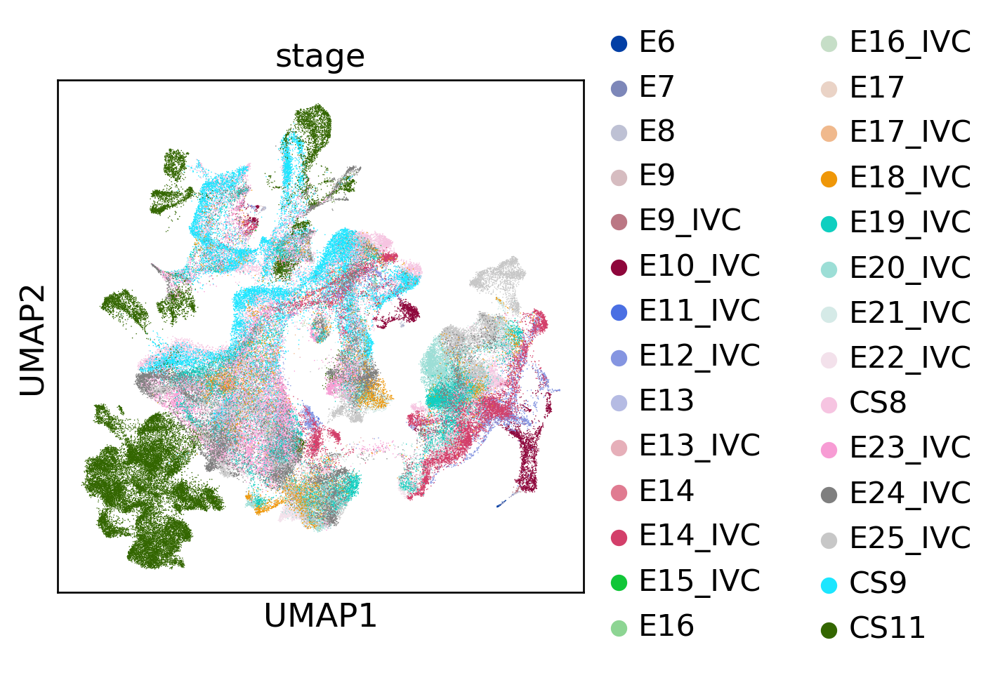

In [6]:
sc.pl.umap(adata, color=['stage'])

In [7]:
# Ensure that 'reanno' is a categorical column
adata.obs['reanno'] = adata.obs['reanno'].astype('category')

# Print the levels (categories) in order
print(adata.obs['reanno'].cat.categories)

Index(['TE', 'CTBs_1', 'CTBs_2', 'CTBs_3', 'STBs_1', 'STBs_2', 'STBs_3',
       'STBs_4', 'EVTs_1', 'EVTs_2', 'EVTs_3', 'EVTs_4', 'EVTs_5', 'Epi_1',
       'Epi_2', 'Epi_3', 'Epi_4', 'Epi_5', 'Amniotic_epi', 'Amnion_1',
       'Amnion_2', 'Amnion_3', 'Primitive.streak', 'Ectoderm_1', 'Ectoderm_2',
       'PGC_1', 'PGC_2', 'Hypoblast_1', 'Hypoblast_2', 'VE/YE', 'AVE', 'Gut_1',
       'Gut_2', 'DE', 'Node', 'YS.Endoderm_1', 'YS.Endoderm_2',
       'YS.Endoderm_3', 'Exe.endothelium', 'pre-Allantois', 'Allantois_1',
       'Allantois_2', 'pre-YS.mesoderm', 'YS.mesoderm', 'Neural tube_1',
       'Neural tube_2', 'Neural crest', 'Nascent mesoderm',
       'Emergent mesoderm', 'Paraxial.meso', 'Intermediate mesoderm',
       'Lateral plate mesoderm_1', 'Lateral plate mesoderm_2',
       'Lateral plate mesoderm_3', 'Lateral plate mesoderm_4',
       'pre-somatic mesoderm', 'Somite', 'Rostral mesoderm',
       'Cardiac myocyte_1', 'Cardiac myocyte_2',
       'Hemogenic endothelial progenitors', 'Endothelium', 'Erythroid',
       'Myeloid progenitor'],
      dtype='object')

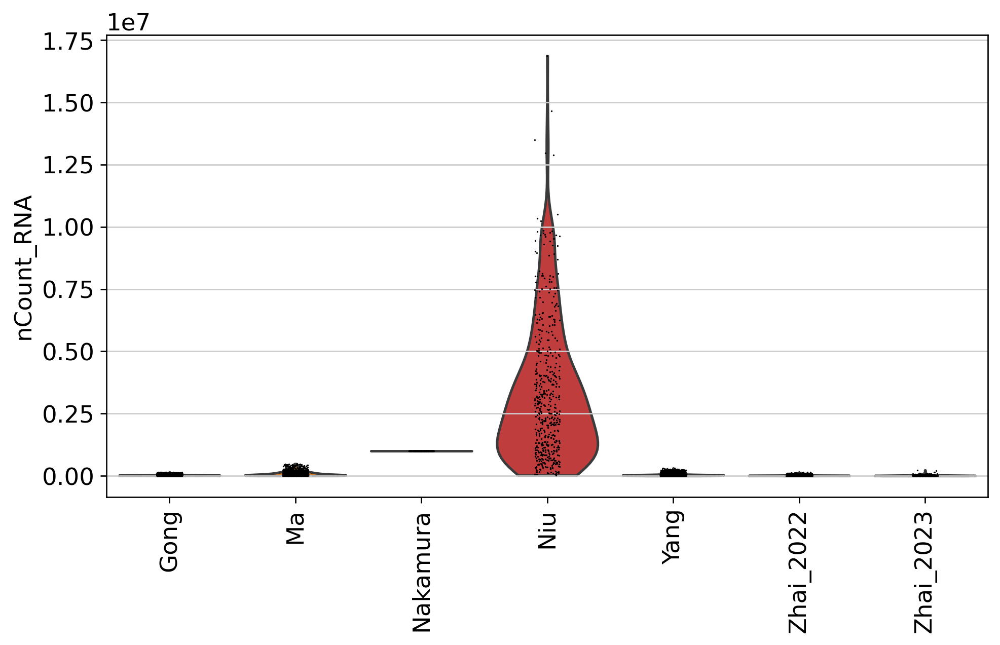

In [8]:
# Generate the violin plot 
sc.pl.violin(
    adata,
    ["nCount_RNA"],
    groupby="orig.ident", 
    #jitter=0.4,
    multi_panel=True,
    rotation=90,  # Optional: adjust rotation for better readability
    show=False   # Prevent automatic display
)

# Set the size and save the figure
plt.gcf().set_size_inches(12, 5)  # Adjust the figure size here
plt.savefig("monkey_nCount_RNA.pdf", dpi=300, bbox_inches="tight")
plt.show()  # Now display the plot

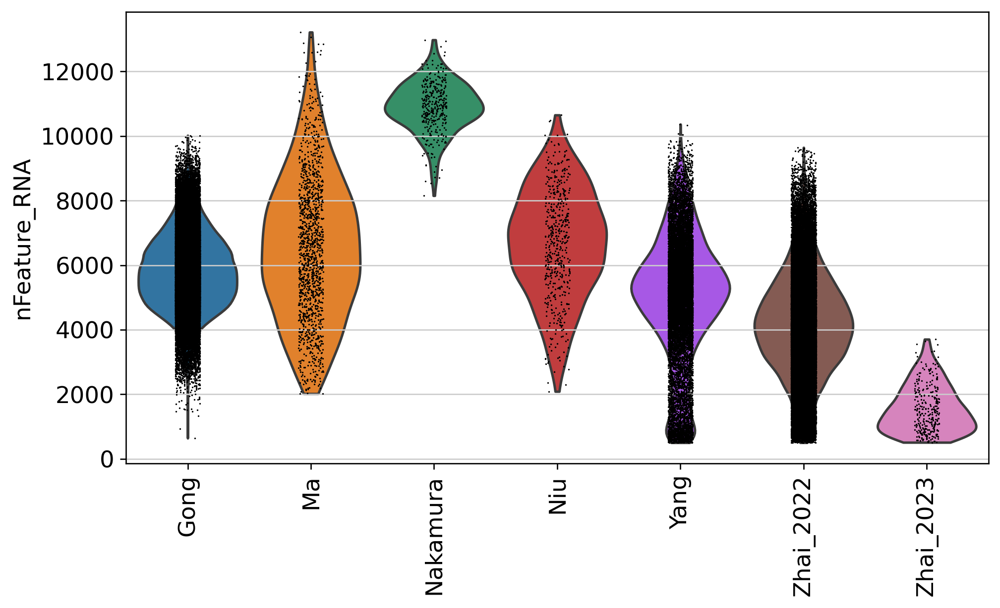

In [9]:
# Generate the violin plot and don't show it immediately
sc.pl.violin(
    adata,
    ["nFeature_RNA"],
    groupby="orig.ident", 
    #jitter=0.4,
    multi_panel=True,
    rotation=90,  # Optional: adjust rotation for better readability
    show=False   # Prevent automatic display
)

# Set the size and save the figure
plt.gcf().set_size_inches(12, 5)  # Adjust the figure size here
plt.savefig("monkey_nFeature_RNA.pdf", dpi=300, bbox_inches="tight")
plt.show()  # Now display the plot

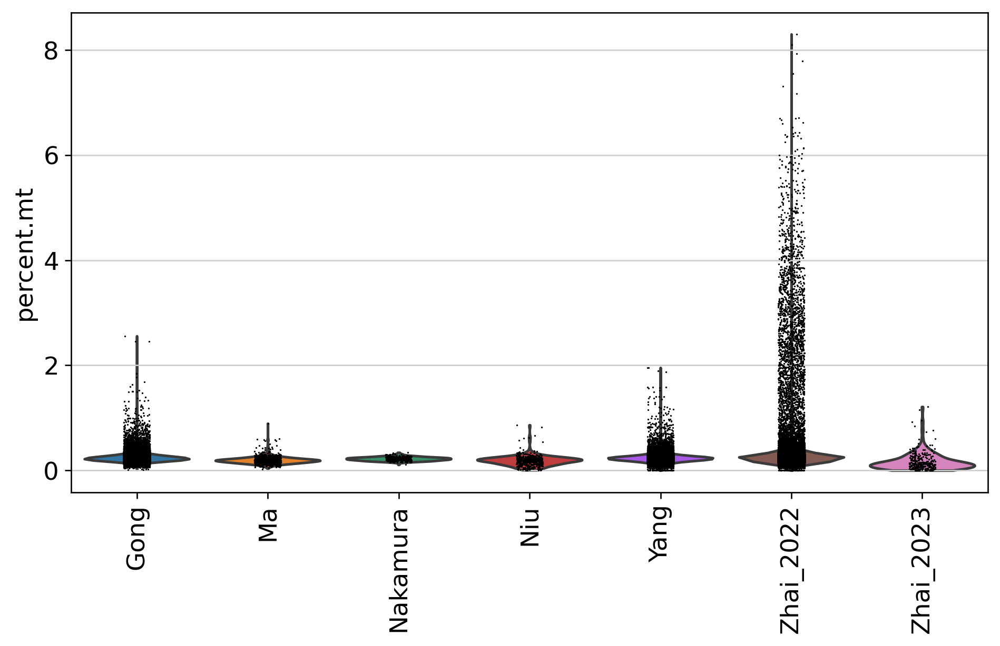

In [10]:
# Generate the violin plot and don't show it immediately
sc.pl.violin(
    adata,
    ["percent.mt"],
    groupby="orig.ident", 
    #jitter=0.4,
    multi_panel=True,
    rotation=90,  # Optional: adjust rotation for better readability
    show=False   # Prevent automatic display
)

# Set the size and save the figure
plt.gcf().set_size_inches(12, 5)  # Adjust the figure size here
plt.savefig("monkey_percent.mt_RNA.pdf", dpi=300, bbox_inches="tight")
plt.show()  # Now display the plot

In [11]:
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import seaborn as sns

# Define the list of genes you want to plot
genes_to_plot = ["POU5F1", "NANOG",  # Epiblast
                 "SOX2", "TTYH1",    # Neural_ectoderm
                 "GATA3", "TFAP2A", 
                 "TBXT", "CDX1", "PDGFRA", "APOA2", "FOXA2", "NANOS3",
                 "PECAM1", "HBZ", "PTPRC",
                 "GABRP", "HEY1", "COL6A1", "COL6A2"]

# Calculate the number of rows and columns needed to fit all the plots
n_genes = len(genes_to_plot)
n_cols = 4  # Define how many plots per row
n_rows = (n_genes + n_cols - 1) // n_cols  # Calculate number of rows needed

# Create the PDF
with PdfPages('umap_gene_plots.pdf') as pdf:
    # Set up a large figure for all the subplots
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, n_rows * 5))  # Adjust figure size
    axes = axes.flatten()  # Flatten axes to easily index them

    for i, gene in enumerate(genes_to_plot):
        ax = axes[i]  # Select the subplot axis
        sc.pl.embedding(
            adata,
            basis='X_umap',
            color=gene,
            use_raw=False,
            cmap=sns.cubehelix_palette(dark=0, light=.9, as_cmap=True),
            show=False,  # Don't display the plot in the interactive window
            ax=ax        # Plot in the current axis
        )
        ax.set_title(gene, fontsize=14)  # Set title for each subplot

    # Remove empty subplots
    for j in range(i+1, len(axes)):
        fig.delaxes(axes[j])

    # Save the single page with all plots
    plt.tight_layout()  # Adjust the layout to fit all subplots
    pdf.savefig(fig, dpi=300)  # Save the figure to the PDF with high resolution
    plt.close(fig)  # Close the figure to free up memory


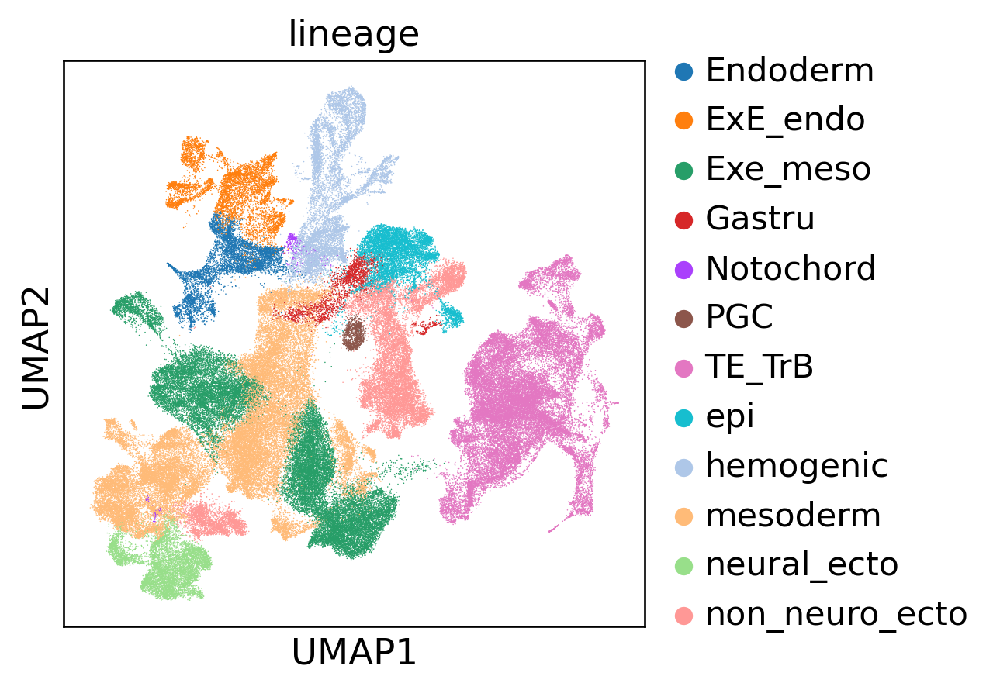

In [12]:
sc.pl.umap(adata, color=['lineage'])

In [13]:
# Generate UMAP plot without displaying it, but storing the axis for modifications
ax = sc.pl.umap(adata, color=["reanno"], groups=['TE', 'CTBs_1','CTBs_2','CTBs_3','STBs_1','STBs_2','STBs_3', 'STBs_4', 'STBs_5', 
                      'EVTs_1', 'EVTs_2', 'EVTs_3', 'EVTs_4','EVTs_5',], show=False, return_fig=True)

# Modify the legend text from "NA" to "the rest"
legend_texts = ax.axes[0].get_legend().get_texts()  # Get the legend texts from the plot
for legend_text in legend_texts:
    if legend_text.get_text() == "NA":
        legend_text.set_text("the rest")

# Adjust the layout to ensure the legend is fully visible
plt.tight_layout()

# Save the plot with bbox_inches='tight' to prevent legend truncation
plt.savefig('monkey_lineage_TE.pdf', dpi=300, bbox_inches='tight')

# Close the plot to free up memory
plt.close()

In [14]:
# focusing on TE/TrB lineage
ana_sub= adata[adata.obs['reanno'].isin(['TE', 'CTBs_1','CTBs_2','CTBs_3','STBs_1','STBs_2','STBs_3', 'STBs_4', 'STBs_5', 
                      'EVTs_1', 'EVTs_2', 'EVTs_3', 'EVTs_4','EVTs_5', ])]

In [15]:

#dot plot
TE_marker_genes = {
    "general": [ "GATA3","TFAP2A","TFAP2C",],
    "TE": [ "TEAD4", "POU5F1","CDX2",],
    "CTBs": [ "ITGA6","FABP5","FGFR1","PEG10","CDH1", ],
    "early_STBs": ["ESRRG","MAFK","TBX20","ATF3",], #"ZNF292",
    "STBs": ["TBX3","CGB2","CGB7","PSG3","PSG6",],
   # "early_EVTs": ["DLX6","HIF1A","NR1H3","DLX5","TFDP2","RXRA",],
    "EVTs":["HLA-G","CSH1","MMP2","ERBB2","KRT7","ASCL2", "SP100", "IRF9", "SP110", "STAT6", "ZNF462",]
   
}

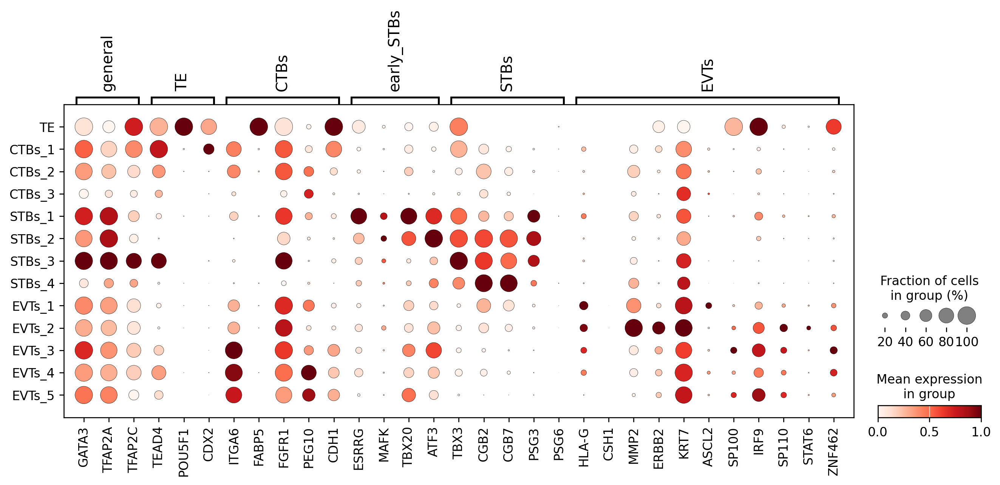

In [16]:
sc.pl.dotplot(ana_sub, TE_marker_genes, groupby="reanno", use_raw=False, standard_scale="var", save='monkey_TE_marker.pdf' )

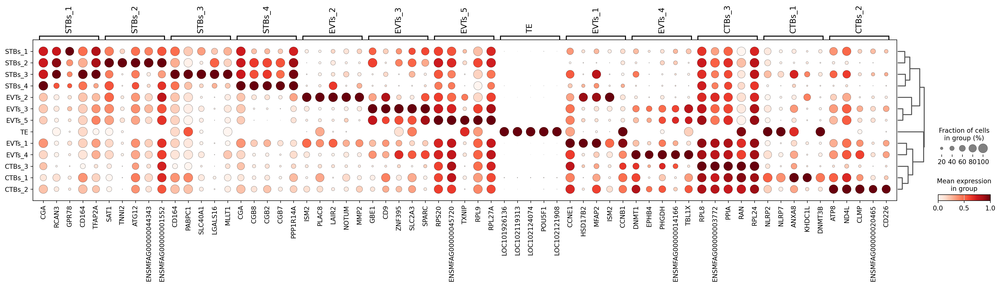

In [17]:
# Obtain cluster-specific differentially expressed genes
sc.tl.rank_genes_groups(ana_sub, groupby="reanno", method="wilcoxon",use_raw=False)
sc.tl.dendrogram(ana_sub, groupby="reanno")

sc.pl.rank_genes_groups_dotplot(ana_sub, groupby="reanno", standard_scale="var", n_genes=5,use_raw=False, save='marker')

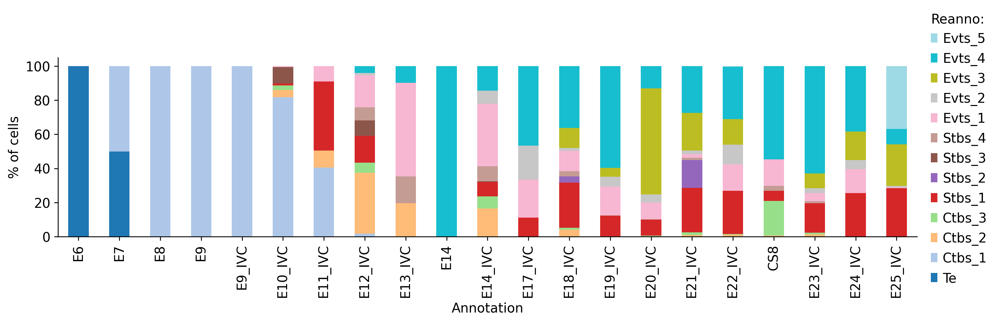

In [18]:
FIGURES = dict()
fz = 12
annos = ['reanno']
for x in annos:
    study_count_per_ct = pd.crosstab(ana_sub.obs['stage'], ana_sub.obs[x])
    study_perc_per_ct = (
        study_count_per_ct.divide(study_count_per_ct.sum(axis=1), axis=0) * 100
    )

    with plt.rc_context(
        {
            "figure.figsize": (14, 3),
            "xtick.labelsize": fz,
            "ytick.labelsize": fz,
            "axes.labelsize": fz,
            "font.size": fz,
            "axes.spines.right": False,
            "axes.spines.top": False,
        }
    ):
        fig, ax = plt.subplots()
        study_perc_per_ct.plot(kind="bar", stacked=True, ax=ax, cmap="tab20", grid=False)
        handles, labels = ax.get_legend_handles_labels()
        labels = [lab.capitalize() for lab in labels]
        ax.legend(
            handles[::-1],
            labels[::-1],
            loc=(1.01, -0.3),
            fontsize=fz,
            frameon=False,
            title=f"{x.capitalize()}:",
        )
        leg = ax.get_legend()
        leg._legend_box.align = "left"
        plt.ylabel("% of cells")
        plt.xlabel("Annotation")
        FIGURES[f"ED_4a_cell_type_{x}"] = fig
        plt.show()

In [19]:
# Plot UMAP with specified colors and groups
ax = sc.pl.umap(adata, color=["reanno"], groups=[ 'Hemogenic endothelial progenitors', 'Endothelium','Erythroid','Myeloid progenitor'], show=False, return_fig=True)

# Modify the legend text from "NA" to "the rest"
legend_texts = ax.axes[0].get_legend().get_texts()  # Get the legend texts from the plot
for legend_text in legend_texts:
    if legend_text.get_text() == "NA":
        legend_text.set_text("the rest")

# Adjust the layout to ensure the legend is fully visible
plt.tight_layout()

# Save the plot with bbox_inches='tight' to prevent legend truncation
plt.savefig('monkey_lineage_hemogenic.pdf', dpi=300, bbox_inches='tight')

# Close the plot to free up memory
plt.close()

In [20]:
# focusing on hemogenic lineage
ana_sub= adata[adata.obs['reanno'].isin(['Hemogenic endothelial progenitors', 'Endothelium','Erythroid','Myeloid progenitor'])]

In [21]:
#dot plot
hemato_marker_genes = {
     "Primitive.streak": ["TBXT", "SP5", "HOXA1", "CDX1", "CDX2", "FST" ],
    "endothelial": [ "PECAM1","CDH5", "KDR", "TEK"],
    "erythroid": [ "GATA1", "KLF1", "GYPB", "HBE1","HBZ"],
    "megakatyocyte":["GP1BB", "ITGA2B", "NFE2", ],
    "myeloid progenitor": [ "PTPRC", "CSF1R", "LYVE1",],  
   
}

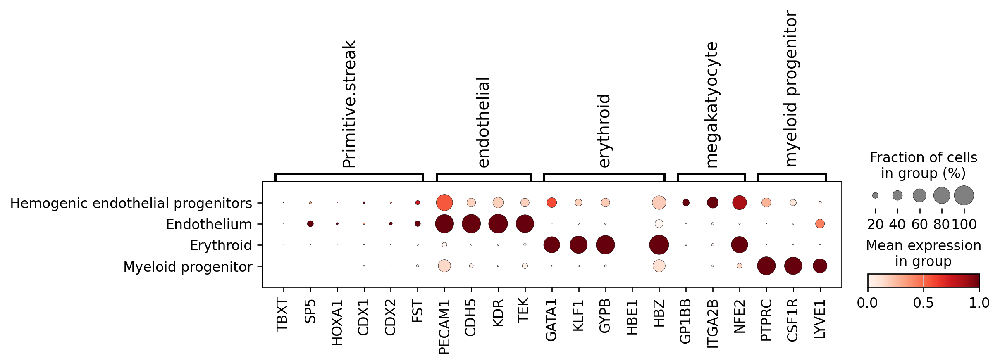

In [22]:
sc.pl.dotplot(ana_sub, hemato_marker_genes, groupby="reanno", use_raw=False, standard_scale="var", save='monkey_hemogenic_marker.pdf')

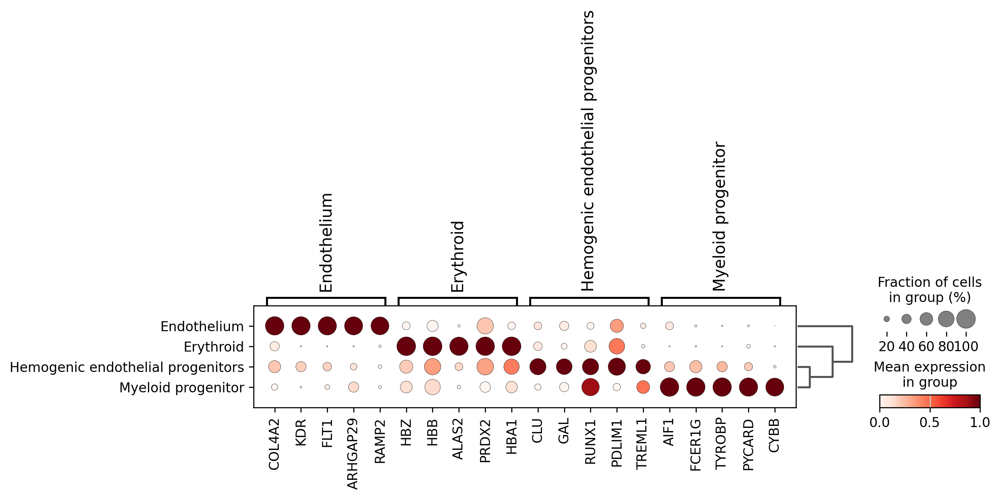

In [23]:
# Obtain cluster-specific differentially expressed genes
sc.tl.rank_genes_groups(ana_sub, groupby="reanno", method="wilcoxon",use_raw=False)
sc.tl.dendrogram(ana_sub, groupby="reanno")

sc.pl.rank_genes_groups_dotplot(ana_sub, groupby="reanno", standard_scale="var", n_genes=5,use_raw=False, save='marker')

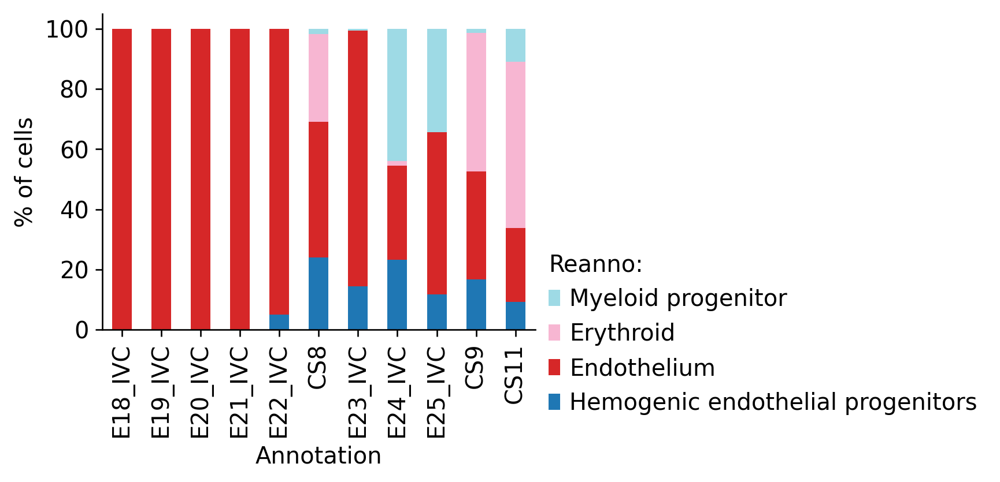

In [24]:
FIGURES = dict()
fz = 12
annos = ['reanno']
for x in annos:
    study_count_per_ct = pd.crosstab(ana_sub.obs['stage'], ana_sub.obs[x])
    study_perc_per_ct = (
        study_count_per_ct.divide(study_count_per_ct.sum(axis=1), axis=0) * 100
    )

    with plt.rc_context(
        {
            "figure.figsize": (4, 3),
            "xtick.labelsize": fz,
            "ytick.labelsize": fz,
            "axes.labelsize": fz,
            "font.size": fz,
            "axes.spines.right": False,
            "axes.spines.top": False,
        }
    ):
        fig, ax = plt.subplots()
        study_perc_per_ct.plot(kind="bar", stacked=True, ax=ax, cmap="tab20", grid=False)
        handles, labels = ax.get_legend_handles_labels()
        labels = [lab.capitalize() for lab in labels]
        ax.legend(
            handles[::-1],
            labels[::-1],
            loc=(1.01, -0.3),
            fontsize=fz,
            frameon=False,
            title=f"{x.capitalize()}:",
        )
        leg = ax.get_legend()
        leg._legend_box.align = "left"
        plt.ylabel("% of cells")
        plt.xlabel("Annotation")
        FIGURES[f"ED_4a_cell_type_{x}"] = fig
        plt.show()

In [25]:
# Plot UMAP with specified colors and groups
ax = sc.pl.umap(adata, color=["reanno"], groups=['Nascent mesoderm','Emergent mesoderm','Paraxial.meso', 'Intermediate mesoderm', 'Lateral plate mesoderm_1',
     'Lateral plate mesoderm_2','Lateral plate mesoderm_3','Lateral plate mesoderm_4',
     'pre-somatic mesoderm','Somite','Rostral mesoderm',
     'Cardiac myocyte_1','Cardiac myocyte_2','Exe.endothelium',                                              
        'pre-Allantois', 'Allantois_1','Allantois_2', 'pre-YS.mesoderm','YS.mesoderm',], show=False, return_fig=True)


# Modify the legend text from "NA" to "the rest"
legend_texts = ax.axes[0].get_legend().get_texts()  # Get the legend texts from the plot
for legend_text in legend_texts:
    if legend_text.get_text() == "NA":
        legend_text.set_text("the rest")

# Set the desired figure size (width, height) in inches
ax.set_size_inches(6, 4)  # Adjust width and height as needed

# Adjust the layout to ensure the legend is fully visible
plt.tight_layout()

# Save the plot with bbox_inches='tight' to prevent legend truncation
plt.savefig('monkey_lineage_meso_exemeso.pdf', dpi=300, bbox_inches='tight')

# Close the plot to free up memory
plt.close()

In [26]:
# focusing on Meso lineage
ana_sub= adata[adata.obs['reanno'].isin(['Nascent mesoderm','Emergent mesoderm','Paraxial.meso', 'Intermediate mesoderm', 'Lateral plate mesoderm_1',
     'Lateral plate mesoderm_2','Lateral plate mesoderm_3','Lateral plate mesoderm_4',
     'pre-somatic mesoderm','Somite','Rostral mesoderm',
     'Cardiac myocyte_1','Cardiac myocyte_2','Exe.endothelium',                                              
                 'pre-Allantois', 'Allantois_1','Allantois_2', 'pre-YS.mesoderm','YS.mesoderm',  ])]

In [27]:

#dot plot
meso_marker_genes = {
    "Primitive.streak": ["TBXT", "SP5",  "CDX1", "CDX2","MIXL1", "FST", ],
    "meso.general":["PDGFRA", "MESP1",  "GATA6",],
    "emergent.meso": ["LEFTY2", "OTX2","LHX1" ],
    "Nascent.meso":["TBX6","MEIS1",],
    #"Notochord":["CHRD", "NOTO"],
    "Axial.meso": ["DCLK1", ],  #monkey doesn't have "ESRG",
    "Paraxial.meso":["MSGN1", "HES7", ],
    "Caudal.meso":[ "SFRP2", "HOXA1"],
    "Rostral.meso":[ "PITX2", "IRX3"],
    "Intermediate.meso":["PAX8", "OSR1", "EYA1", ],
    "lateral plate.meso":["HAND1", "HAPLN1", "BMP4", "FOXF1", "SNAI2" ],
    "ExE mesoderm progenitor":["LUM", "POSTN", "IGF2", "ANXA1"],
   "YS mesoderm":[ "CREB3L1", "NR2F2", "PLAGL1",  "NID2"],
    #"Allantoic stalk":["CDX1", "CDX2", "FGF9", "FGF18", "SHH", "WNT5B", "MDK"],

   # "myocyte": ["PITX2", "TGFBI"],
    "cardio myocyte":["TNNT2", "MYL7", "TNNI1", "MYH10"],
    "somite":["ALDH1A2",  "MEOX2", "MEOX1",  "FOXC2"],

     "ecto.epi.general":[ "POU5F1", "DNMT3B","EPCAM","CLDN6"],
    #"radial glial":["CDH2", "NES",  "FABP7", "VIM"],
    # "neural.ecto":["SOX3", "PAX6", "TTYH1"],
    # "neural crest":["SOX10", "MPZ", "TFAP2A"],
    # "neural tube":["SOX2", "OTX2", "RFX4"],
   # "proliferating.meso": ["MKI67", "TOP2A", "CDK1" ],
    #"Amniotic.ecto": ["TFAP2C", "GATA3", "MSX2",  "WNT6","DLX5",],
        "EXM": ["DEPDC1B", "FBN2", "FRMD4B", "HAND2", "OAF"],
    "Allantois": ["COL6A2", "COL6A1",  "PCOLCE", "VCAN"],
    "endothelial": [ "PECAM1","CDH5", "KDR", "TEK"],
   
}

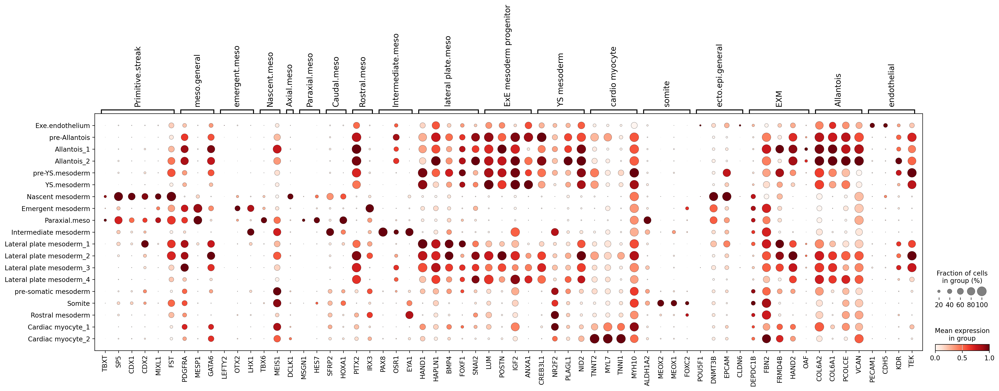

In [28]:
sc.pl.dotplot(ana_sub, meso_marker_genes, groupby="reanno", use_raw=False, standard_scale="var", save='monkey_mesoderm_marker.pdf')

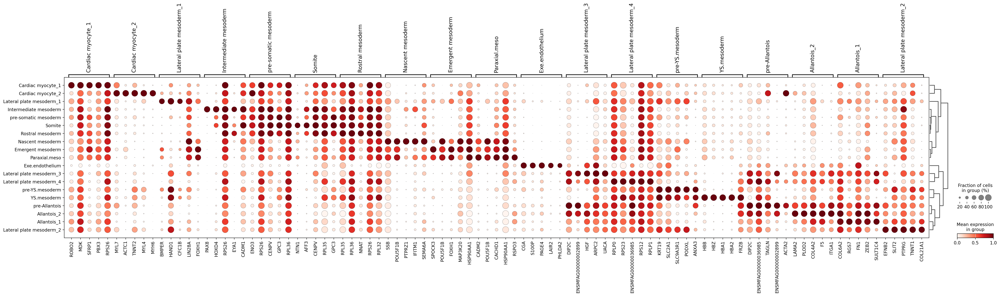

In [29]:
# Obtain cluster-specific differentially expressed genes
sc.tl.rank_genes_groups(ana_sub, groupby="reanno", method="wilcoxon",use_raw=False)
sc.tl.dendrogram(ana_sub, groupby="reanno")

sc.pl.rank_genes_groups_dotplot(ana_sub, groupby="reanno", standard_scale="var", n_genes=5,use_raw=False, save='marker')

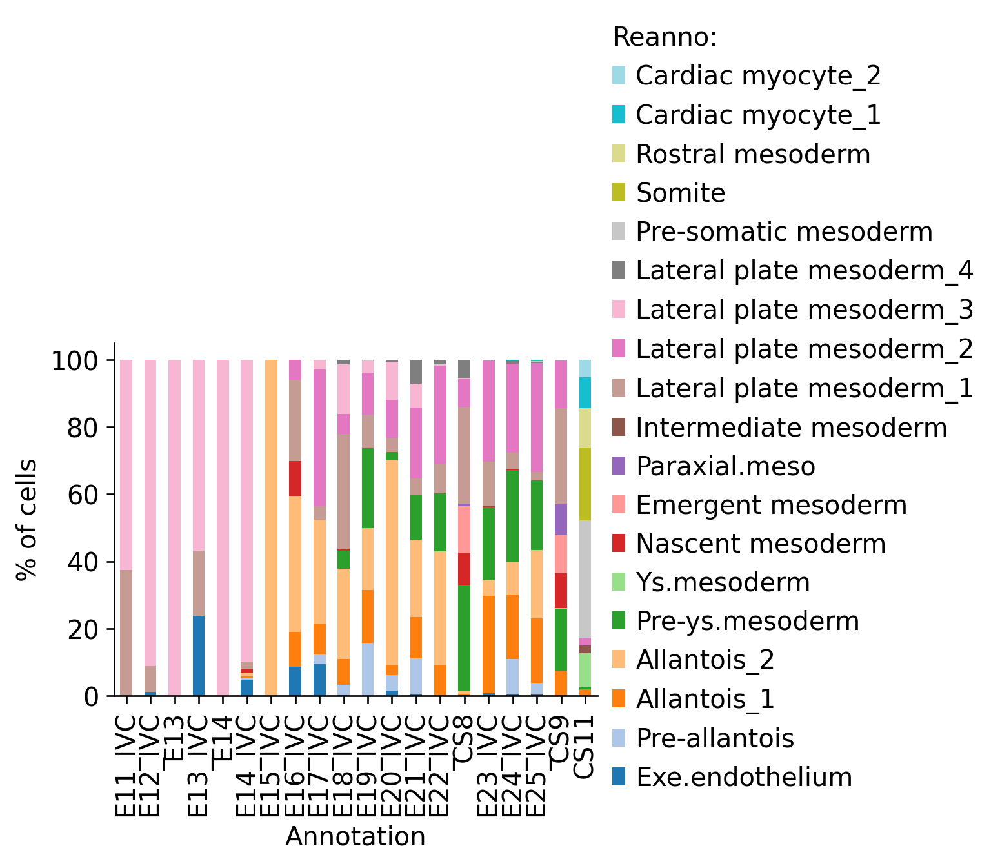

In [30]:
FIGURES = dict()
fz = 12
annos = ['reanno']
for x in annos:
    study_count_per_ct = pd.crosstab(ana_sub.obs['stage'], ana_sub.obs[x])
    study_perc_per_ct = (
        study_count_per_ct.divide(study_count_per_ct.sum(axis=1), axis=0) * 100
    )

    with plt.rc_context(
        {
            "figure.figsize": (4, 3),
            "xtick.labelsize": fz,
            "ytick.labelsize": fz,
            "axes.labelsize": fz,
            "font.size": fz,
            "axes.spines.right": False,
            "axes.spines.top": False,
        }
    ):
        fig, ax = plt.subplots()
        study_perc_per_ct.plot(kind="bar", stacked=True, ax=ax, cmap="tab20", grid=False)
        handles, labels = ax.get_legend_handles_labels()
        labels = [lab.capitalize() for lab in labels]
        ax.legend(
            handles[::-1],
            labels[::-1],
            loc=(1.01, -0.3),
            fontsize=fz,
            frameon=False,
            title=f"{x.capitalize()}:",
        )
        leg = ax.get_legend()
        leg._legend_box.align = "left"
        plt.ylabel("% of cells")
        plt.xlabel("Annotation")
        FIGURES[f"ED_4a_cell_type_{x}"] = fig
        plt.show()

In [31]:
# Plot UMAP with specified colors and groups
ax = sc.pl.umap(adata, color=["reanno"], groups=['Epi_1','Epi_2','Epi_3','Epi_4','Epi_5','Epi_6','Amniotic_epi','Amnion_1','Amnion_2','Amnion_3','Amniotic mesoderm',
                   'Primitive.streak', 'Epithelium','Ectoderm_1','Ectoderm_2','PGC_1','PGC_2',  'Neural tube_1','Neural tube_2','Neural crest', ], show=False, return_fig=True)

# Modify the legend text from "NA" to "the rest"
legend_texts = ax.axes[0].get_legend().get_texts()  # Get the legend texts from the plot
for legend_text in legend_texts:
    if legend_text.get_text() == "NA":
        legend_text.set_text("the rest")

# Set the desired figure size (width, height) in inches
ax.set_size_inches(6, 4)  # Adjust width and height as needed

# Adjust the layout to ensure the legend is fully visible
plt.tight_layout()

# Save the plot with bbox_inches='tight' to prevent legend truncation
plt.savefig('human_lineage_epi.pdf', dpi=300, bbox_inches='tight')

# Close the plot to free up memory
plt.close()


In [32]:
# focusing on Meso lineage
ana_sub= adata[adata.obs['reanno'].isin(['Epi_1','Epi_2','Epi_3','Epi_4','Epi_5','Epi_6','Amniotic_epi','Amnion_1','Amnion_2','Amnion_3','Amniotic mesoderm',
                   'Primitive.streak', 'Epithelium','Ectoderm_1','Ectoderm_2','PGC_1','PGC_2',  'Neural tube_1','Neural tube_2','Neural crest',])]


In [33]:
#dot plot
all_marker_genes = {
    "epi.general": [ "POU5F1","NANOG","SOX2",],
    "primed Epi":["UTF1", "FGF2", "DNMT3B", "SOX11", "SFRP2", "SALL2" ,],
    "Amniotic.epi": ["TFAP2C", "GATA3", "MSX2", "TFAP2A", "WNT6","DLX5",],
    "Advanced amnion": ["GABRP", "IGFBP3", "IGFBP5",],
    "Primitive.streak": ["TBXT", "SP5", "HOXA1", "CDX1", "CDX2","MIXL1", "FST" ],
    "PGC":["NANOS3", "PDPN", "PRDM1"],
    "epithelium":[ "EPCAM","CLDN6"],
    #"hypoblast":["GATA6","SOX17","PDGFRA","GATA4"],
    "ExE.endoderm progenitor": ["PODXL", "CDH2", "APOA1", "IHH", "FOXA1", "FOXA2", "HNF4A",],
    #"AVE":["LHX1", "HHEX", "EOMES", "GSC", "CER1", "LEFTY1", "LEFTY2","NOG"],
    #"VE/YE":["AFP", "TTR", "APOA4", "APOC3","MTTP","GJB1"],
   # "anterior endoderm": ["HHEX", "OTX2", "SHISA2", "CER1"],
         "neural.ecto":["SOX3", "PAX6", "TTYH1"],
     "neural crest":["SOX10", "MPZ", "TFAP2A"],
     "neural tube":["SOX2", "OTX2", "RFX4"],
        "meso.general":[ "MESP1", "PDGFRA", "GATA6"],
        #"myocyte": ["PITX2", "TGFBI"],
   # "cardio myocyte":["TNNT2", "MYL7", "TNNI1", "MYH10"],
   # "somite":["ALDH1A2",  "MEOX2", "MEOX1"],
      #  "YS.ExE.meso":["GNRH2", "SPINK1","MT2A", "A2M"],
   # "YS.mesothelium":["PODXL", "CDH1"], 
   # "Notochord":["CHRD", "NOTO"],
  "ExE mesoderm progenitor":["LUM", "POSTN", "IGF2", "ANXA1"],
   "YS mesoderm":[ "CREB3L1", "NR2F2", "PLAGL1",  "NID2"],
    #"Allantoic stalk":["CDX1", "CDX2", "FGF9", "FGF18", "SHH", "WNT5B", "MDK"],

   # "myocyte": ["PITX2", "TGFBI"],
    #"radial glial":["CDH2", "NES",  "FABP7", "VIM"],
    # "neural.ecto":["SOX3", "PAX6", "TTYH1"],
    # "neural crest":["SOX10", "MPZ", "TFAP2A"],
    # "neural tube":["SOX2", "OTX2", "RFX4"],
   # "proliferating.meso": ["MKI67", "TOP2A", "CDK1" ],
    #"Amniotic.ecto": ["TFAP2C", "GATA3", "MSX2",  "WNT6","DLX5",],
        "EXM": ["DEPDC1B", "FBN2", "FRMD4B", "HAND2", "OAF"],
    "Allantois": ["COL6A2", "COL6A1",  "PCOLCE", "VCAN"]

 }

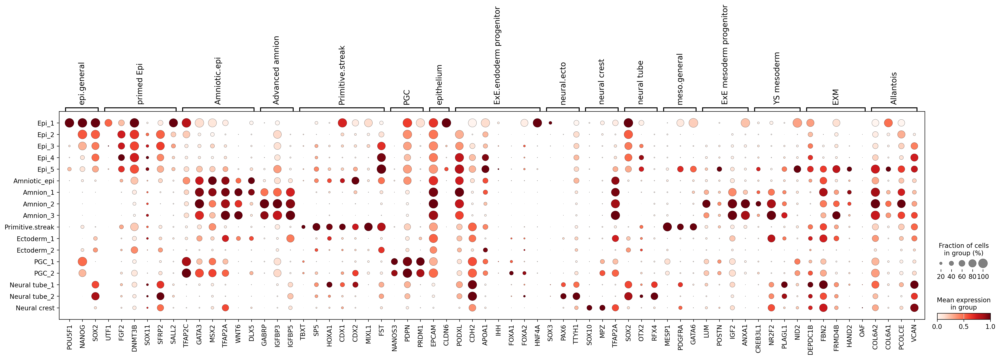

In [34]:
sc.pl.dotplot(ana_sub, all_marker_genes, groupby="reanno", use_raw=False, standard_scale="var",save='monkey_epi_marker.pdf')

In [35]:
# Plot UMAP with specified colors and groups
ax = sc.pl.umap(adata, color=["reanno"], groups=[ 'Hypoblast_1','Hypoblast_2','VE/YE','AVE','Gut_1','Gut_2',
             'DE','Node','YS.Endoderm_1','YS.Endoderm_2','YS.Endoderm_3', ], show=False, return_fig=True)

# Modify the legend text from "NA" to "the rest"
legend_texts = ax.axes[0].get_legend().get_texts()  # Get the legend texts from the plot
for legend_text in legend_texts:
    if legend_text.get_text() == "NA":
        legend_text.set_text("the rest")
# Set the desired figure size (width, height) in inches
ax.set_size_inches(6, 4)  # Adjust width and height as needed

# Adjust the layout to ensure the legend is fully visible
plt.tight_layout()

# Save the plot with bbox_inches='tight' to prevent legend truncation
plt.savefig('human_lineage_endoderm.pdf', dpi=300, bbox_inches='tight')

# Close the plot to free up memory
plt.close()



In [36]:
# focusing on Meso lineage
ana_sub= adata[adata.obs['reanno'].isin([ 'Hypoblast_1','Hypoblast_2','VE/YE','AVE','Gut_1','Gut_2',
             'DE','Node','YS.Endoderm_1','YS.Endoderm_2','YS.Endoderm_3', ])]


In [37]:
#dot plot
all_marker_genes = {
    "epi.general": [ "POU5F1","NANOG","SOX2",],
    #"primed Epi":["UTF1", "FGF2", "DNMT3B", "SOX11", "SFRP2", "SALL2" ,],
    #"Amniotic.epi": ["TFAP2C", "GATA3", "MSX2", "TFAP2A", "WNT6","DLX5",],
    #"Advanced amnion": ["GABRP", "IGFBP3", "IGFBP5",],
    "Primitive.streak": ["TBXT", "SP5", "HOXA1", "CDX1", "CDX2","MIXL1", "FST" ],
      "Notochord":["CHRD", "NOTO"],
    #"PGC":["NANOS3", "PDPN", "PRDM1"],
    "epithelium":[ "EPCAM","CLDN6"],
    "hypoblast":["GATA6","SOX17","PDGFRA","GATA4"],
    "ExE.endoderm progenitor": ["PODXL", "CDH2", "APOA1", "IHH", "FOXA1",  "HNF4A",],
    "AVE":["LHX1", "HHEX", "EOMES", "GSC", "CER1", "LEFTY1", "LEFTY2",],
    "VE/YE":["AFP", "TTR", "APOA4", "APOC3","MTTP","GJB1"],
    "DE":["APOA2","FOXA2","UCP2", ], #"RDX",
         "foregut": [ "MECOM","NR4A1","EGFR","BMP4","IFI6",],
    "midgut":["MNX1", "HOXB2", "HOXC9",],
    "hindgut": ["HOXA10", "CXCL12","RSPO3","TMEM88","KITLG", "COL4A1",],
   # "anterior endoderm": ["HHEX", "OTX2", "SHISA2", "CER1"],
         #"neural.ecto":["SOX3", "PAX6", "TTYH1"],
    # "neural crest":["SOX10", "MPZ", "TFAP2A"],
    # "neural tube":["SOX2", "OTX2", "RFX4"],
        "meso.general":[ "MESP1", "PDGFRA", "GATA6"],
        #"myocyte": ["PITX2", "TGFBI"],
   # "cardio myocyte":["TNNT2", "MYL7", "TNNI1", "MYH10"],
   # "somite":["ALDH1A2",  "MEOX2", "MEOX1"],
      #  "YS.ExE.meso":["GNRH2", "SPINK1","MT2A", "A2M"],
   # "YS.mesothelium":["PODXL", "CDH1"], 
  
 # "ExE mesoderm progenitor":["LUM", "POSTN", "IGF2", "ANXA1"],
  # "YS mesoderm":[ "CREB3L1", "NR2F2", "PLAGL1", "ANXA1", "NID2"],
    #"Allantoic stalk":["CDX1", "CDX2", "FGF9", "FGF18", "SHH", "WNT5B", "MDK"],

   # "myocyte": ["PITX2", "TGFBI"],
    #"radial glial":["CDH2", "NES",  "FABP7", "VIM"],
    # "neural.ecto":["SOX3", "PAX6", "TTYH1"],
    # "neural crest":["SOX10", "MPZ", "TFAP2A"],
    # "neural tube":["SOX2", "OTX2", "RFX4"],
   # "proliferating.meso": ["MKI67", "TOP2A", "CDK1" ],
    #"Amniotic.ecto": ["TFAP2C", "GATA3", "MSX2",  "WNT6","DLX5",],
    #    "EXM": ["DEPDC1B", "FBN2", "FRMD4B", "HAND2", "OAF"],
   # "Allantois": ["COL6A2", "COL6A1",  "PCOLCE", "VCAN"],
   #"endothelial": [ "PECAM1","CDH5", "KDR", "TEK"],

 }

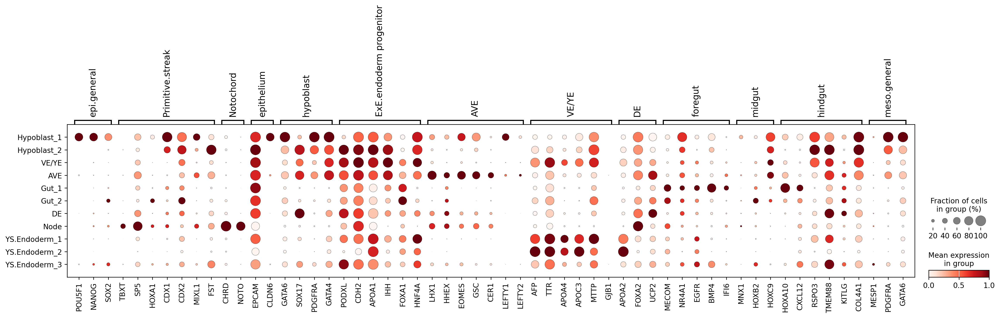

In [38]:
sc.pl.dotplot(ana_sub, all_marker_genes, groupby="reanno", use_raw=False, standard_scale="var", save='monkey_endo_marker.pdf')